# UK Coin Count

This notebook contains the solution to the following objectives:

- **Q1**: Create a distribution plot for each image set, showing the total sterling value of coins in each image. Non-UK coins should be ignored.
- **Q2**: Create distribution plots showing the number of ‘heads’ detected per image.

The project is based on two unlabelled datasets:
- **DB1**: Simple coin images.
- **DB2**: More complex samples with harder visual conditions.

---

### My Approach

Since the datasets are unlabelled, I first needed a way to detect and classify coins. I used **Roboflow** to label the data by coin type and orientation (head/tail) and applied data augmentation to improve model robustness.

To tackle the problem efficiently, I used a transfer learning approach — specifically YOLO — to train a model that could generalise well to both datasets.

---

### What's in this Notebook

The following sections show:
- Explanatory Data Analysis (EDA), to understand our original data structure.
- How the models were trained and evaluated.
- Sample predictions.
- The final distribution plots that answer Q1 and Q2.



## EDA

Since we are dealing with image dataset, our EDA steps are as follow:

* number of images
* Image dimensions
* Channel information (RGB etc)
* Visual and sample previews 

In [ ]:
# getting all the dependencies
%pip install tensorflow matplotlib seaborn pillow numpy opencv-python ultralytics labelImg

#PS: i installed more but forgot to add them here :)

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import os
import numpy as np
from PIL import Image

In [18]:
#image count and structure  
data_dir = 'Data\dataset1' # data path 
image_paths = [os.path.join(data_dir, fname) for fname in os.listdir(data_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))]

print(f"Total number of images: {len(image_paths)}")

Total number of images: 400


In [19]:
# image dimensions 
dims = []

for img_path in image_paths:
    with Image.open(img_path) as img:
        dims.append(img.size)  # (width, height)

print (f"image dimension: {dims[:1]}")

image dimension: [(350, 350)]


In [20]:
#checking colour channels
channels = []

for img_path in image_paths[:50]:  # Limit to avoid slowdown
    with Image.open(img_path) as img:
        channels.append(len(img.getbands()))

print(f"Channel modes detected: {set(channels)}") #dealing with RGB


Channel modes detected: {3}


## Q1: Model creation

we will be using YOLO V8 version, due to it's being efficient while being accurate. But before making any prediction on our data, we will be creating a small dataset (annotating 100 images), then those images will be augmented and e.g., applying various exposures, rotation, cropping etc to give the model more exposure when it comes to detecting images from dataset 2.

In [3]:
from ultralytics import YOLO

#getting YOLO nano 
model = YOLO('yolov8n.pt')

# fine-running the parameters for our need
results = model.train(
    data='Data\DB102\data.yaml',    # YOLO uses yaml file to coordinates the images along with it's labels AKA the bounding boxes
    imgsz=350,                      # using image size of 350x350 as our original dataset contains images with that size 
    epochs=50,                  
    batch=16,                 
    project='runs/train_DB1',       # saving the outcome
    name='coin_value_v8n',          # file name
    device='cpu',                   # will be using CPU instead of GPU, can be changed to 'GPU' if available
)

New https://pypi.org/project/ultralytics/8.3.145 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.144  Python-3.11.9 torch-2.7.0+cu118 CPU (13th Gen Intel Core(TM) i7-13700K)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Data\DB102\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=350, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=coin_value_v8n3, nbs=64, nms=False, opset=None, opt

train: Scanning C:\Users\Amir\Desktop\Hexcel Technical interview\Data\DB102\train\labels.cache... 573 images, 0 backgrounds, 0 corrupt: 100%|██████████| 573/573 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 640.456.5 MB/s, size: 171.9 KB)



val: Scanning C:\Users\Amir\Desktop\Hexcel Technical interview\Data\DB102\valid\labels.cache... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<?, ?it/s]


Plotting labels to runs\train_DB1\coin_value_v8n3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 352 train, 352 val
Using 0 dataloader workers
Logging results to runs\train_DB1\coin_value_v8n3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      0.782      3.005     0.9712         59        352: 100%|██████████| 36/36 [00:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         54        169     0.0147      0.982       0.25      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/50         0G     0.7463      1.885     0.9662         66        352: 100%|██████████| 36/36 [00:14<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         54        169       0.44      0.641      0.393      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       3/50         0G     0.7279      1.622     0.9501         86        352: 100%|██████████| 36/36 [00:14<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         54        169      0.338      0.687      0.524      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/50         0G     0.6933      1.469     0.9317         70        352: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.39it/s]

                   all         54        169      0.412       0.51      0.495      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/50         0G     0.6502      1.358     0.9215         81        352: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         54        169      0.469      0.717      0.688      0.592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       6/50         0G     0.6505      1.323     0.9224         68        352: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         54        169      0.419      0.798      0.699      0.608

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/50         0G     0.6328      1.205      0.913         81        352: 100%|██████████| 36/36 [00:13<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]

                   all         54        169      0.577      0.733      0.713      0.624

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/50         0G     0.6441      1.176     0.9151         63        352: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.43it/s]

                   all         54        169      0.516      0.805      0.691      0.615

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       9/50         0G     0.6073      1.087     0.9012         72        352: 100%|██████████| 36/36 [00:14<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         54        169      0.592      0.746      0.719      0.639

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/50         0G     0.6005      1.079     0.9017         72        352: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         54        169      0.734      0.824      0.861      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G     0.6134      1.045     0.8988         79        352: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]

                   all         54        169      0.526      0.897      0.781      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      12/50         0G     0.5915      1.035     0.8993         62        352: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.23it/s]

                   all         54        169      0.708      0.745      0.832      0.742

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      13/50         0G     0.5952     0.9845     0.8947         69        352: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all         54        169      0.589      0.711      0.676      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      14/50         0G     0.5864     0.9354      0.896         76        352: 100%|██████████| 36/36 [00:13<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]

                   all         54        169      0.714      0.874      0.821      0.741

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      15/50         0G     0.5771     0.9225     0.8946         93        352: 100%|██████████| 36/36 [00:14<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         54        169      0.794      0.782      0.846      0.753

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      16/50         0G     0.5673     0.8999     0.8901         62        352: 100%|██████████| 36/36 [00:14<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         54        169      0.749      0.831      0.884      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      17/50         0G     0.5656     0.8741     0.8896         60        352: 100%|██████████| 36/36 [00:14<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         54        169      0.636      0.903      0.852      0.767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      18/50         0G     0.5697     0.8286     0.8905         69        352: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.53it/s]

                   all         54        169      0.647       0.79      0.844      0.747

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      19/50         0G     0.5612     0.8411     0.8911         57        352: 100%|██████████| 36/36 [00:14<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         54        169      0.613      0.791      0.804      0.732

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      20/50         0G     0.5662     0.8264     0.8871         75        352: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.53it/s]

                   all         54        169      0.703      0.914      0.874      0.784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      21/50         0G     0.5557      0.813     0.8858         78        352: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]

                   all         54        169      0.717      0.805       0.85      0.765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      22/50         0G     0.5484     0.7548     0.8815         62        352: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         54        169      0.652      0.775       0.79      0.714

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      23/50         0G     0.5506     0.7412     0.8812         56        352: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]

                   all         54        169      0.842      0.849      0.879      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      24/50         0G     0.5445     0.7236     0.8806         69        352: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]

                   all         54        169      0.693      0.869      0.849      0.765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      25/50         0G     0.5505     0.7128     0.8859         53        352: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.63it/s]

                   all         54        169      0.719      0.847      0.861      0.776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      26/50         0G     0.5426     0.7005      0.881         87        352: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.56it/s]

                   all         54        169      0.874      0.701      0.891       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      27/50         0G     0.5312     0.6823     0.8758         64        352: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.64it/s]

                   all         54        169      0.737      0.803       0.88      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      28/50         0G     0.5291     0.6669     0.8799         51        352: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.59it/s]

                   all         54        169      0.708      0.777      0.816      0.746

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      29/50         0G     0.5295     0.6501     0.8787         72        352: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.61it/s]

                   all         54        169      0.735      0.944        0.9      0.812

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      30/50         0G     0.5273     0.6546     0.8795         62        352: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.64it/s]

                   all         54        169      0.718      0.861      0.876      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      31/50         0G     0.5202     0.6436     0.8759         99        352: 100%|██████████| 36/36 [00:14<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.68it/s]

                   all         54        169      0.768      0.907      0.911      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      32/50         0G     0.5241     0.6272     0.8765         53        352: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.69it/s]

                   all         54        169       0.74      0.808      0.875        0.8

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      33/50         0G     0.5124     0.6148     0.8764         79        352: 100%|██████████| 36/36 [00:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         54        169      0.859       0.89      0.933      0.854

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      34/50         0G     0.5101     0.6353      0.878         83        352: 100%|██████████| 36/36 [00:14<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         54        169      0.641      0.829      0.844      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50         0G     0.5121     0.6136     0.8734         78        352: 100%|██████████| 36/36 [00:14<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]

                   all         54        169      0.735      0.882       0.92      0.845

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      36/50         0G     0.5075     0.6099     0.8741         70        352: 100%|██████████| 36/36 [00:14<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.68it/s]

                   all         54        169       0.85      0.924      0.946      0.861

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      37/50         0G     0.5022      0.603     0.8732         67        352: 100%|██████████| 36/36 [00:13<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.67it/s]

                   all         54        169      0.745      0.855        0.9      0.822

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      38/50         0G      0.496     0.5614     0.8664         72        352: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.64it/s]

                   all         54        169      0.726      0.955      0.917       0.84

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      39/50         0G     0.5054      0.562     0.8702         48        352: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all         54        169      0.801      0.853       0.89      0.811

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      40/50         0G     0.4974     0.5518     0.8723         57        352: 100%|██████████| 36/36 [00:14<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]

                   all         54        169      0.707      0.873      0.873      0.795
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      41/50         0G     0.4284     0.4526     0.8362         44        352: 100%|██████████| 36/36 [00:13<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.56it/s]

                   all         54        169       0.77      0.839      0.869      0.793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      42/50         0G     0.4253     0.4132      0.832         40        352: 100%|██████████| 36/36 [00:13<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.66it/s]

                   all         54        169      0.772      0.907      0.899      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      43/50         0G     0.4189     0.3856     0.8332         41        352: 100%|██████████| 36/36 [00:13<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all         54        169      0.802      0.907      0.906      0.831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      44/50         0G     0.4135     0.3852     0.8328         41        352: 100%|██████████| 36/36 [00:13<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.66it/s]

                   all         54        169      0.785      0.879      0.917      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      45/50         0G     0.4129     0.3663     0.8364         42        352: 100%|██████████| 36/36 [00:13<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all         54        169      0.832      0.927       0.92      0.844

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      46/50         0G     0.4105     0.3597     0.8354         40        352: 100%|██████████| 36/36 [00:13<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.66it/s]

                   all         54        169      0.821      0.923      0.887      0.815

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      47/50         0G     0.4052     0.3493     0.8267         40        352: 100%|██████████| 36/36 [00:13<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.63it/s]

                   all         54        169      0.826      0.904      0.911      0.834

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      48/50         0G     0.4034      0.346     0.8334         40        352: 100%|██████████| 36/36 [00:13<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.58it/s]

                   all         54        169      0.812       0.93      0.922      0.847

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      49/50         0G     0.3964      0.341     0.8253         44        352: 100%|██████████| 36/36 [00:13<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all         54        169      0.837      0.927      0.929       0.85

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      50/50         0G     0.4028     0.3347     0.8257         40        352: 100%|██████████| 36/36 [00:13<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.53it/s]

                   all         54        169      0.874       0.89      0.927      0.849

50 epochs completed in 0.204 hours.
Optimizer stripped from runs\train_DB1\coin_value_v8n3\weights\last.pt, 6.2MB


Optimizer stripped from runs\train_DB1\coin_value_v8n3\weights\best.pt, 6.2MB

Validating runs\train_DB1\coin_value_v8n3\weights\best.pt...
Ultralytics 8.3.144  Python-3.11.9 torch-2.7.0+cu118 CPU (13th Gen Intel Core(TM) i7-13700K)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]


                   all         54        169       0.85      0.924      0.946      0.861
                     0         49         83      0.952      0.946      0.988      0.903
                     1         18         22      0.727      0.864      0.924      0.864
                     2         28         31          1      0.819      0.978      0.872
                     3          7          7      0.571          1      0.844      0.739
                     5         26         26          1      0.992      0.995      0.926
Speed: 0.1ms preprocess, 6.4ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\train_DB1\coin_value_v8n3


### Running evaluation on our Val and test splits  

In [41]:
from ultralytics import YOLO

# loading our best model 
model = YOLO('runs/train_DB1/coin_value_v8n3/weights/best.pt')

# validating on val split 
val_metrics = model.val(
    data='Data/DB102/data.yaml',  
    split='val'                 
)

print("Validation results:", val_metrics)

# validating on test split
test_metrics = model.val(
    data='Data/DB102/data.yaml',
    split='test'
)

print("Test results:", test_metrics)


Ultralytics 8.3.145  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Ti, 12282MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 1566.9432.3 MB/s, size: 149.8 KB)


val: Scanning C:\Users\Amir\Desktop\Hexcel Technical interview\Data\DB102\valid\labels.cache... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]


                   all         54        169       0.85      0.925      0.944       0.86
                     0         49         83      0.952      0.948      0.988      0.904
                     1         18         22      0.727      0.864      0.924      0.864
                     2         28         31          1      0.819      0.978      0.872
                     3          7          7       0.57          1      0.837      0.733
                     5         26         26          1      0.992      0.995      0.926
Speed: 0.7ms preprocess, 5.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs\detect\val
Validation results: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002188F160F50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confide

val: Scanning C:\Users\Amir\Desktop\Hexcel Technical interview\Data\DB102\test\labels... 28 images, 0 backgrounds, 0 corrupt: 100%|██████████| 28/28 [00:00<00:00, 944.05it/s]

val: New cache created: C:\Users\Amir\Desktop\Hexcel Technical interview\Data\DB102\test\labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]


                   all         28         88      0.886      0.927      0.964       0.89
                     0         25         38      0.912          1      0.994      0.925
                     1         10         15      0.933      0.925      0.971       0.92
                     2         15         17      0.937      0.877      0.976      0.911
                     3          5          6      0.704      0.833      0.885      0.778
                     5         10         12      0.947          1      0.995      0.914
Speed: 0.4ms preprocess, 10.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs\detect\val2
Test results: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002188F01D9D0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(

### Making Prediction on the original Datasets (both 1 and 2)

For this step we will be using our best predictive model, which is trained on the augmented dataset that we created to make predictions on both datasets. Note the following code chunks aim to load the model, take in the designated dataset (1 or 2), then make it's prediction on it and save the output, both images as well as their corresponding labels, thus, the labels can be used to create a distribution plot.

In [37]:
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Loading the best model
model = YOLO('runs/train_DB1/coin_value_v8n3/weights/best.pt')

# getting all the images from Dataset 1
image_dir = 'Data/dataset2'
image_paths = [
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
]

# Run inference and save predictions for later visualization
results = model.predict(
    source=image_paths,
    imgsz=350,
    batch=16,
    save=True,        # saves annotated images
    save_txt=True,    # saves labels in YOLO .txt format
    project='runs/predict',
    name='dataset2_results',
    verbose=False
)

WARNING imgsz=[350] must be multiple of max stride 32, updating to [352]
Results saved to runs\predict\dataset2_results
400 labels saved to runs\predict\dataset2_results\labels


## Q1: Creating a Distribution Plot For Dataset1

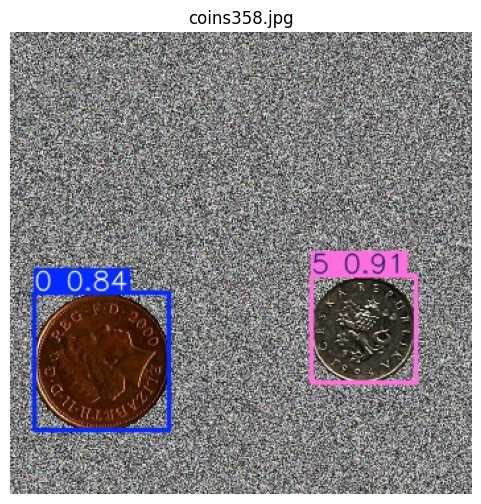

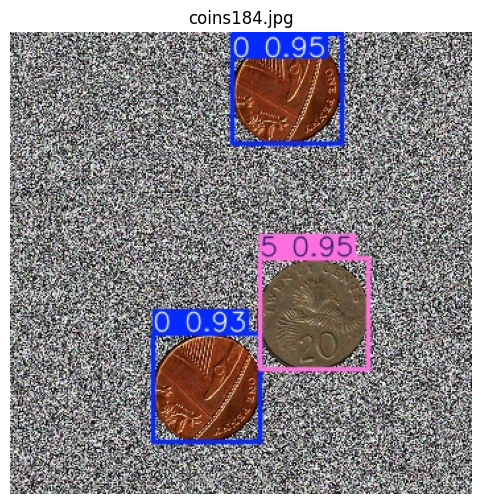

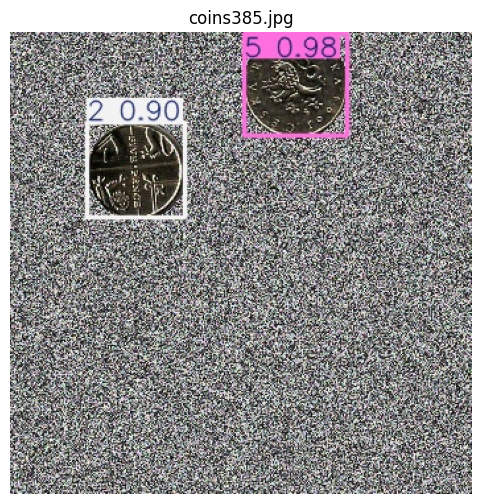

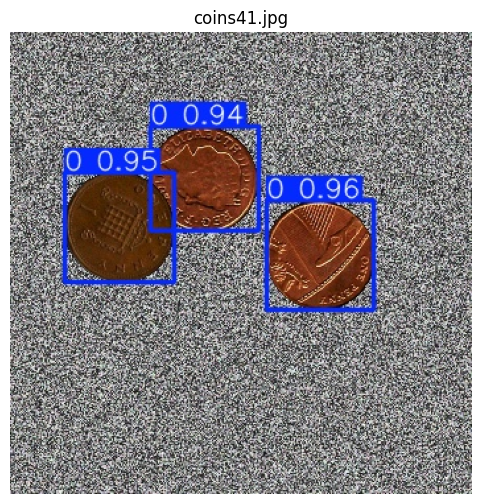

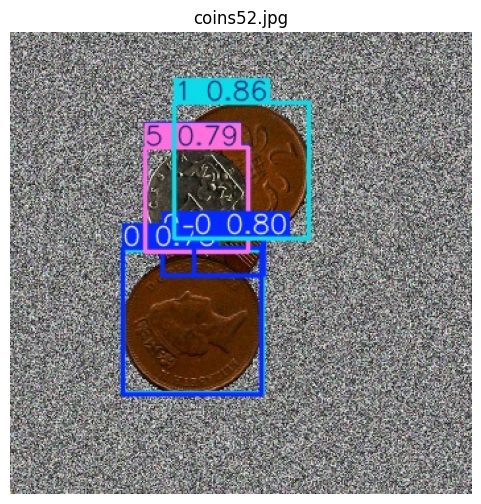

In [1]:
                                                 #Visualizing some outputs form dataset1 

import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Folder containing YOLO output images (with boxes already drawn)
image_dir = "runs/predict/dataset1_results"

# Get list of image files (ignore the 'labels' folder and non-image files)
image_files = [f for f in os.listdir(image_dir)
               if f.lower().endswith((".jpg", ".png", ".jpeg"))
               and not os.path.isdir(os.path.join(image_dir, f))]

# Randomly select 5 images
sampled_images = random.sample(image_files, 5)

# Display each image
for filename in sampled_images:
    img_path = os.path.join(image_dir, filename)
    img = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(filename)
    plt.show()


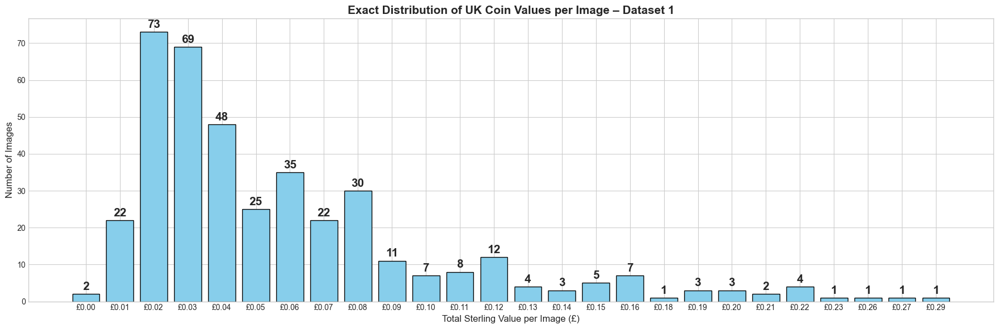

In [ ]:
import os
from collections import Counter
import matplotlib.pyplot as plt

# Path to YOLO label files (Dataset 1)
label_dir = "runs/predict/dataset1_results/labels"

# Map of UK coin class IDs to their sterling values
UK_CLASS_TO_VALUE = {
    "0": 0.01,  # 1p
    "1": 0.02,  # 2p
    "2": 0.05,  # 5p
    "3": 0.10,  # 10p
    "4": 0.20,  # 20p
    # "5" is a non-UK coin and excluded
}

image_totals = []

# Calculate total coin value for each image
for filename in os.listdir(label_dir):                                  #Loop through all the files in our directory
    if filename.endswith(".txt"):                                       #only look for the .txt
        total_value = 0                                                 #give the current value of 0 
        with open(os.path.join(label_dir, filename), "r") as f:         #opening the label file 
            for line in f:                                              #read each detected objects
                parts = line.strip().split()                            #split the line into components
                if parts:
                    class_id = parts[0]                                 #Getting class ID e.g., 0,1,2 etc
                    value = UK_CLASS_TO_VALUE.get(class_id)             #getting the coin values based on our defined mapping
                    if value is not None:                               
                        total_value += value                            # add that value to the image's total 
        image_totals.append(round(total_value, 2))                      #saving the value and rounding it up to 2dp

# Count how many images had each exact total value
value_counts = Counter(image_totals) # counts the total items in the image 
sorted_items = sorted(value_counts.items())  # stores it as a ascending order

# Separate into x (coin values) and y (image counts)
x_vals = [f"£{val:.2f}" for val, _ in sorted_items]  # Convert to string labels for x-axis
y_vals = [count for _, count in sorted_items]        # list comprehension the number of total images for each coin values then assigning to y-axis

# Plot the bar chart
plt.style.use("seaborn-v0_8-whitegrid")
fig, ax = plt.subplots(figsize=(18, 6))  # Wider layout to avoid overlap

bars = ax.bar(x_vals, y_vals, color='skyblue', edgecolor='black')

# Add number labels above each bar
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.5, str(int(height)),
            ha='center', va='bottom', fontsize=15, fontweight='bold')

# Title and axis labels
ax.set_title("Exact Distribution of UK Coin Values per Image – Dataset 1", fontsize=15, fontweight='bold')
ax.set_xlabel("Total Sterling Value per Image (£)", fontsize=12)
ax.set_ylabel("Number of Images", fontsize=12)

plt.tight_layout()
plt.show()

## Q1: Creating a Distribution Plot For Dataset2 

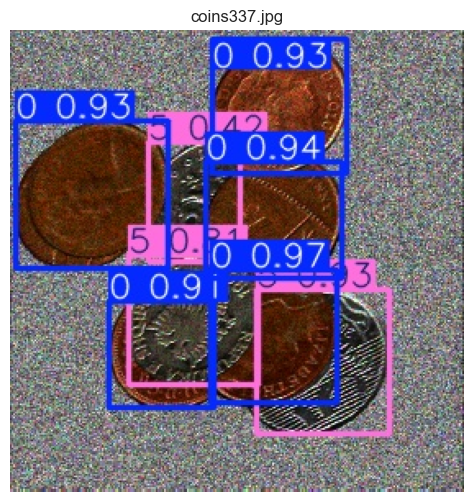

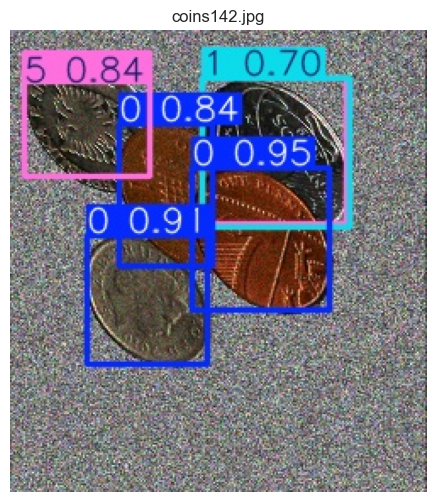

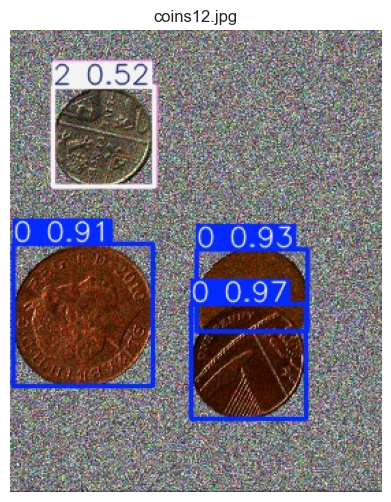

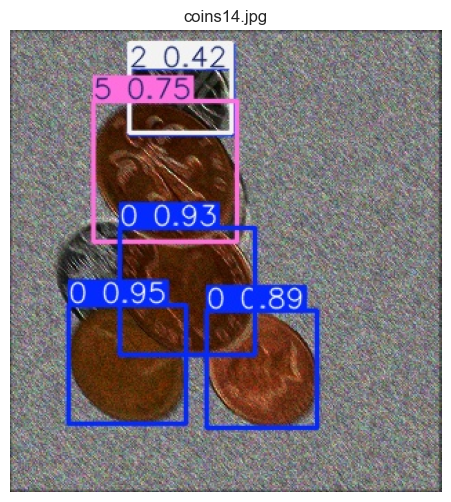

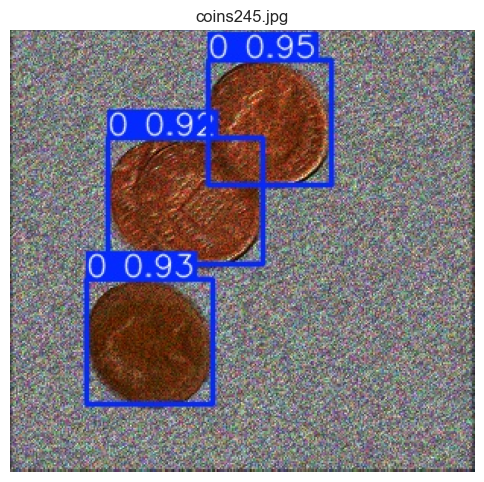

In [ ]:
                                                 #Visualizing some outputs form dataset2 

import os
import random
from PIL import Image
import matplotlib.pyplot as plt


image_dir = "runs/predict/dataset2_results"

# Get list of image files (ignore the 'labels' folder and non-image files)
image_files = [f for f in os.listdir(image_dir)
               if f.lower().endswith((".jpg", ".png", ".jpeg"))
               and not os.path.isdir(os.path.join(image_dir, f))]

# Randomly select 5 images
sampled_images = random.sample(image_files, 5)

# Display each image
for filename in sampled_images:
    img_path = os.path.join(image_dir, filename)
    img = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(filename)
    plt.show()


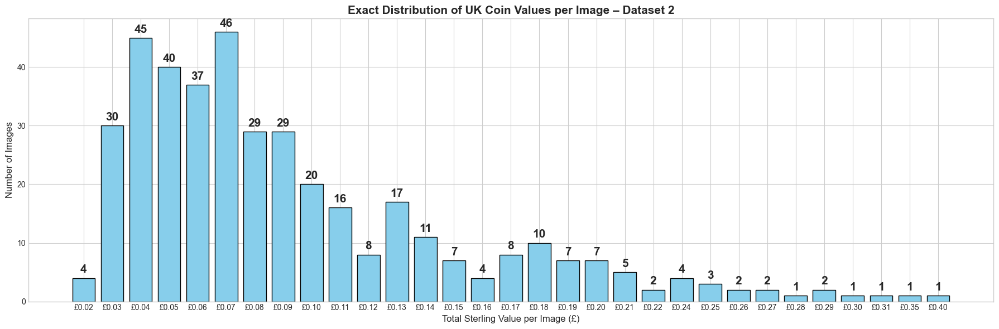

In [9]:
import os
from collections import Counter
import matplotlib.pyplot as plt


label_dir = "runs/predict/dataset2_results/labels"


UK_CLASS_TO_VALUE = {
    "0": 0.01,  # 1p
    "1": 0.02,  # 2p
    "2": 0.05,  # 5p
    "3": 0.10,  # 10p
    "4": 0.20,  # 20p
    # "5" is a non-UK coin and excluded
}

image_totals = []

# Calculate total coin value for each image
for filename in os.listdir(label_dir):
    if filename.endswith(".txt"):
        total_value = 0
        with open(os.path.join(label_dir, filename), "r") as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    class_id = parts[0]
                    value = UK_CLASS_TO_VALUE.get(class_id)
                    if value is not None:
                        total_value += value
        image_totals.append(round(total_value, 2))  # Round to 2 decimal places

# Count how many images had each exact total value
value_counts = Counter(image_totals)
sorted_items = sorted(value_counts.items())  # Sort by coin value

# Separate into x (coin values) and y (image counts)
x_vals = [f"£{val:.2f}" for val, _ in sorted_items]  # Convert to string labels for x-axis
y_vals = [count for _, count in sorted_items]

# Plot the bar chart
plt.style.use("seaborn-v0_8-whitegrid")
fig, ax = plt.subplots(figsize=(18, 6))  # Wider layout to avoid overlap

bars = ax.bar(x_vals, y_vals, color='skyblue', edgecolor='black')

# Add number labels above each bar
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.5, str(int(height)),
            ha='center', va='bottom', fontsize=15, fontweight='bold')

# Title and axis labels
ax.set_title("Exact Distribution of UK Coin Values per Image – Dataset 2", fontsize=15, fontweight='bold')
ax.set_xlabel("Total Sterling Value per Image (£)", fontsize=12)
ax.set_ylabel("Number of Images", fontsize=12)

plt.tight_layout()
plt.show()

## Q2: Model Creation 

we will be taking the same approach as Q1, but this time we will train the model on a small sample of images to detect heads vs tail and then create a plot based on those

In [ ]:
from ultralytics import YOLO

# Load base model
model = YOLO('yolov8m.pt')  # using 8m (Medium) for better performance

model.train(
    data='Data/Q2DB/data.yaml',  
    imgsz=352,
    epochs=50,
    batch=16,
    dropout = 0.1,
    project='runs/train_heads_vs_tails',
    name='yolo_heads_tails_final',
    device= 'GPU',
    # --- Augmentations ---
    shear=5.0,         # Handle slanted coins (For DB2)
    perspective=0.001, # Mild perspective change
    fliplr=0.5,        # Horizontal flip

)


Ultralytics 8.3.145  Python-3.11.9 torch-2.5.1+cu121 CUDA:gpu (NVIDIA GeForce RTX 4070 Ti, 12282MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Data/Q2DB/data.yaml, degrees=0.0, deterministic=True, device=gpu, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=352, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_heads_tails_final2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.001, plots

train: Scanning C:\Users\Amir\Desktop\Hexcel Technical interview\Data\Q2DB\train\labels.cache... 256 images, 0 backgrounds, 0 corrupt: 100%|██████████| 256/256 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.00.0 ms, read: 1391.3341.3 MB/s, size: 187.5 KB)


val: Scanning C:\Users\Amir\Desktop\Hexcel Technical interview\Data\Q2DB\valid\labels.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]


Plotting labels to runs\train_heads_vs_tails\yolo_heads_tails_final2\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 352 train, 352 val
Using 8 dataloader workers
Logging results to runs\train_heads_vs_tails\yolo_heads_tails_final2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.72G     0.7905       2.83      1.046        117        352: 100%|██████████| 8/8 [00:00<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.90it/s]

                   all         30         87      0.451      0.378      0.363      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.72G     0.6265      1.531     0.9315        170        352: 100%|██████████| 8/8 [00:00<00:00, 12.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.64it/s]

                   all         30         87      0.464      0.953        0.7      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.72G      0.575     0.8707     0.8892        191        352: 100%|██████████| 8/8 [00:00<00:00, 12.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.11it/s]

                   all         30         87      0.727      0.847      0.852      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.72G     0.5719     0.7283     0.8866        150        352: 100%|██████████| 8/8 [00:00<00:00, 13.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

                   all         30         87      0.932      0.878      0.923       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.72G     0.5717     0.7475     0.8883        155        352: 100%|██████████| 8/8 [00:00<00:00, 13.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.20it/s]

                   all         30         87      0.918      0.907      0.952      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.72G     0.5865     0.6747      0.891        148        352: 100%|██████████| 8/8 [00:00<00:00, 13.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]

                   all         30         87      0.797       0.88      0.912      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.72G     0.5813     0.6213     0.8827        172        352: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]

                   all         30         87      0.897      0.908      0.936      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.72G     0.5993     0.6651     0.8914        172        352: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]

                   all         30         87      0.584       0.81      0.711       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.72G     0.5518     0.6146     0.8807        149        352: 100%|██████████| 8/8 [00:00<00:00, 14.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.683      0.796      0.892      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.72G     0.5592     0.6153     0.8861        183        352: 100%|██████████| 8/8 [00:00<00:00, 14.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.875      0.845      0.938      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.72G     0.5466     0.6063     0.8852        169        352: 100%|██████████| 8/8 [00:00<00:00, 14.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87       0.94      0.898      0.934      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.72G     0.5585     0.5943     0.8876        168        352: 100%|██████████| 8/8 [00:00<00:00, 14.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87        0.8      0.826      0.887      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.72G     0.5733     0.5862     0.8836        139        352: 100%|██████████| 8/8 [00:00<00:00, 14.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87       0.79      0.861      0.915      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.72G     0.5576     0.5791     0.8782        157        352: 100%|██████████| 8/8 [00:00<00:00, 14.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.696      0.903       0.89      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.72G     0.5622     0.5945     0.8983        171        352: 100%|██████████| 8/8 [00:00<00:00, 14.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.876       0.84      0.923      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.72G     0.5593     0.5858     0.8872        150        352: 100%|██████████| 8/8 [00:00<00:00, 14.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

                   all         30         87      0.923      0.885       0.94      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.72G     0.5488     0.5444     0.8764        182        352: 100%|██████████| 8/8 [00:00<00:00, 14.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.743       0.84      0.885      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.72G     0.5498     0.5552      0.879        158        352: 100%|██████████| 8/8 [00:00<00:00, 14.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

                   all         30         87      0.938      0.897      0.962      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.72G     0.5464     0.5621     0.8765        119        352: 100%|██████████| 8/8 [00:00<00:00, 13.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.916      0.925      0.953      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.72G     0.5375     0.5119     0.8917        180        352: 100%|██████████| 8/8 [00:00<00:00, 14.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.98it/s]

                   all         30         87      0.953      0.942       0.96      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.72G     0.5251     0.5047     0.8748        200        352: 100%|██████████| 8/8 [00:00<00:00, 14.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.917       0.92      0.946      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.72G     0.5201     0.4953      0.866        187        352: 100%|██████████| 8/8 [00:00<00:00, 14.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.927      0.957      0.964      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.72G     0.5166     0.5027      0.879        161        352: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

                   all         30         87      0.949      0.906      0.971      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.72G     0.4892     0.4746     0.8651        160        352: 100%|██████████| 8/8 [00:00<00:00, 14.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.33it/s]

                   all         30         87      0.933      0.963      0.965      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.72G     0.5036     0.4474     0.8707        178        352: 100%|██████████| 8/8 [00:00<00:00, 14.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

                   all         30         87      0.958      0.989      0.962       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.72G     0.5029     0.4711     0.8705        162        352: 100%|██████████| 8/8 [00:00<00:00, 14.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

                   all         30         87      0.949      0.971      0.963      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.72G     0.5014     0.4519     0.8668        179        352: 100%|██████████| 8/8 [00:00<00:00, 14.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.946      0.976      0.968      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.72G     0.4845     0.4438      0.863        165        352: 100%|██████████| 8/8 [00:00<00:00, 13.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.66it/s]

                   all         30         87      0.955      0.919      0.967      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.72G     0.4919     0.4244     0.8697        148        352: 100%|██████████| 8/8 [00:00<00:00, 14.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.36it/s]

                   all         30         87      0.946      0.987      0.969      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.72G     0.4965     0.4398     0.8597        160        352: 100%|██████████| 8/8 [00:00<00:00, 14.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.946      0.972      0.966      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.72G     0.4853     0.4292     0.8607        159        352: 100%|██████████| 8/8 [00:00<00:00, 13.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.33it/s]

                   all         30         87      0.942      0.954      0.964      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.72G      0.484     0.4505     0.8664        152        352: 100%|██████████| 8/8 [00:00<00:00, 13.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.922      0.989      0.968      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.72G     0.5041     0.4437     0.8706        154        352: 100%|██████████| 8/8 [00:00<00:00, 13.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.24it/s]

                   all         30         87      0.911      0.944      0.959      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.72G     0.4931     0.4345     0.8646        155        352: 100%|██████████| 8/8 [00:00<00:00, 13.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

                   all         30         87      0.945      0.979      0.972      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.72G     0.4888     0.4194     0.8718        173        352: 100%|██████████| 8/8 [00:00<00:00, 14.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

                   all         30         87      0.954      0.987      0.971      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.72G     0.4644     0.4074     0.8522        145        352: 100%|██████████| 8/8 [00:00<00:00, 14.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.952      0.987       0.97      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.72G     0.4723     0.3992      0.852        162        352: 100%|██████████| 8/8 [00:00<00:00, 14.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.33it/s]

                   all         30         87      0.958      0.976      0.971      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.72G     0.4877      0.398     0.8711        193        352: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

                   all         30         87      0.956      0.972       0.97      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.72G     0.4729      0.387     0.8598        166        352: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.962      0.979      0.973      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.72G     0.4579     0.3692     0.8584        149        352: 100%|██████████| 8/8 [00:00<00:00, 13.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.956      0.981      0.977      0.911


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      5.72G      0.378     0.2931     0.8258         92        352: 100%|██████████| 8/8 [00:00<00:00,  9.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.945      0.977      0.963      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      5.72G     0.3781     0.2755     0.8298         91        352: 100%|██████████| 8/8 [00:00<00:00, 14.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]

                   all         30         87      0.944      0.961      0.969      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      5.72G     0.3711     0.2586     0.8293         93        352: 100%|██████████| 8/8 [00:00<00:00, 14.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]

                   all         30         87      0.964      0.974      0.978      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.72G      0.382     0.2874     0.8284         97        352: 100%|██████████| 8/8 [00:00<00:00, 14.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.76it/s]

                   all         30         87      0.959      0.959      0.972      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.72G     0.3764      0.268     0.8242         95        352: 100%|██████████| 8/8 [00:00<00:00, 14.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.971      0.961      0.972      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.72G     0.3654     0.2554     0.8248         96        352: 100%|██████████| 8/8 [00:00<00:00, 13.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.99it/s]

                   all         30         87      0.972      0.987      0.973      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.72G     0.3582     0.2316     0.8222         90        352: 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.19it/s]

                   all         30         87      0.961      0.989      0.975      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      5.72G     0.3507      0.233     0.8208         94        352: 100%|██████████| 8/8 [00:00<00:00, 14.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all         30         87      0.961      0.989      0.981       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      5.72G     0.3563     0.2294     0.8223         96        352: 100%|██████████| 8/8 [00:00<00:00, 13.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.42it/s]

                   all         30         87      0.962      0.989      0.981      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.72G     0.3542     0.2334     0.8167         94        352: 100%|██████████| 8/8 [00:00<00:00, 14.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.43it/s]


                   all         30         87      0.962      0.989       0.98      0.929

50 epochs completed in 0.016 hours.
Optimizer stripped from runs\train_heads_vs_tails\yolo_heads_tails_final2\weights\last.pt, 22.5MB
Optimizer stripped from runs\train_heads_vs_tails\yolo_heads_tails_final2\weights\best.pt, 22.5MB

Validating runs\train_heads_vs_tails\yolo_heads_tails_final2\weights\best.pt...
Ultralytics 8.3.145  Python-3.11.9 torch-2.5.1+cu121 CUDA:gpu (NVIDIA GeForce RTX 4070 Ti, 12282MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.74it/s]


                   all         30         87      0.962      0.989      0.981      0.932
                     0         27         43      0.955          1      0.984      0.924
                     1         26         44      0.968      0.977      0.978      0.941
Speed: 0.0ms preprocess, 0.5ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs\train_heads_vs_tails\yolo_heads_tails_final2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DA2D30A910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0

In [49]:
from ultralytics import YOLO

# loading our best model 
model = YOLO('runs/train_heads_vs_tails/yolo_heads_tails_final/weights/best.pt')

# validating on val split 
val_metrics = model.val(
    data='Data/Q2DB/data.yaml',
    split='val'                 
)

print("Validation results:", val_metrics)


Ultralytics 8.3.145  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Ti, 12282MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2599.31117.2 MB/s, size: 189.7 KB)


val: Scanning C:\Users\Amir\Desktop\Hexcel Technical interview\Data\Q2DB\valid\labels.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]


                   all         30         87      0.941      0.978       0.99      0.939
                     0         27         43      0.955      0.978      0.987      0.922
                     1         26         44      0.928      0.977      0.993      0.955
Speed: 0.3ms preprocess, 4.2ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs\detect\val3
Validation results: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DA7BA29A10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.01

### making prediction on both datasets 

In [63]:
import os
from ultralytics import YOLO

# Loading the best model
model = YOLO('runs/train_heads_vs_tails/yolo_heads_tails_final/weights/best.pt')

image_dir = 'Data/dataset2'
image_paths = [
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
]

# Run inference and save predictions for later visualization
results = model.predict(
    source=image_paths,
    imgsz=352,
    batch=16,
    save=True,        # saves annotated images
    save_txt=True,    # saves labels in YOLO .txt format
    project='runs/predict/Q2',
    name='dataset2_results_extra',
    verbose=False
)

Results saved to runs\predict\Q2\dataset2_results_extra
400 labels saved to runs\predict\Q2\dataset2_results_extra\labels


## Q2: Creating a Distribution Plot for Dataset1 Only Head Counts

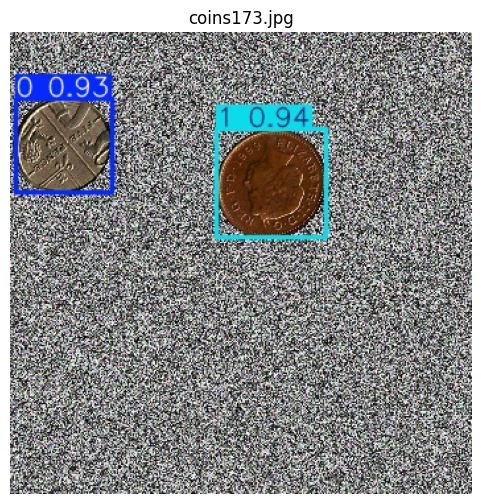

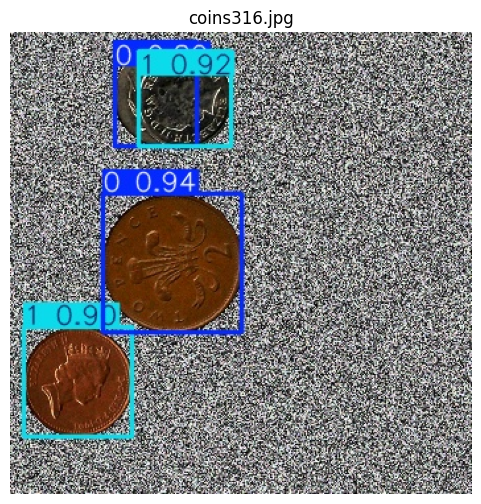

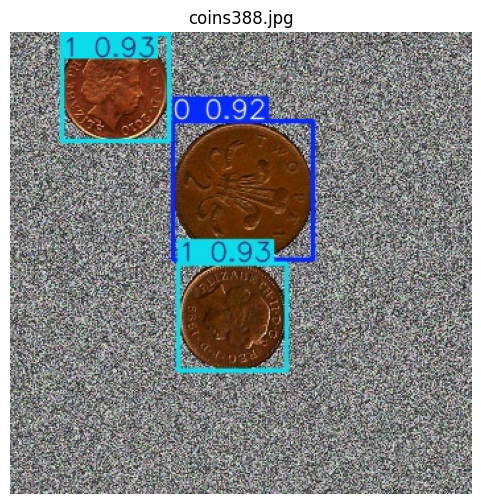

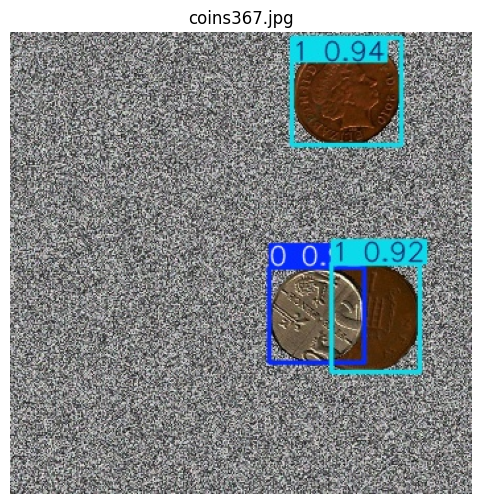

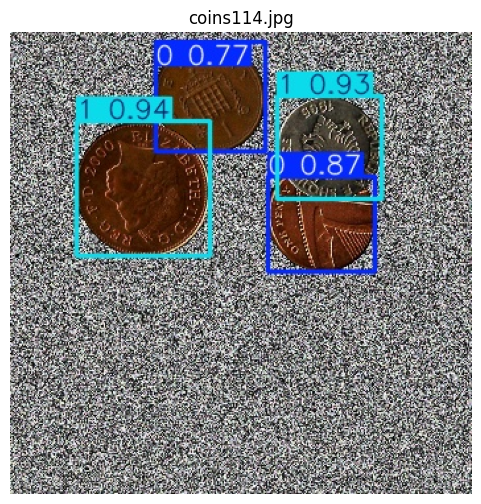

In [1]:
                                                 #Visualizing some outputs form dataset1 

import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Folder containing YOLO output images (with boxes already drawn)
image_dir = "runs\predict\Q2\dataset1_results_extra"

# Get list of image files (ignore the 'labels' folder and non-image files)
image_files = [f for f in os.listdir(image_dir)
               if f.lower().endswith((".jpg", ".png", ".jpeg"))
               and not os.path.isdir(os.path.join(image_dir, f))]

# Randomly select 5 images
sampled_images = random.sample(image_files, 5)

# Display each image
for filename in sampled_images:
    img_path = os.path.join(image_dir, filename)
    img = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(filename)
    plt.show()


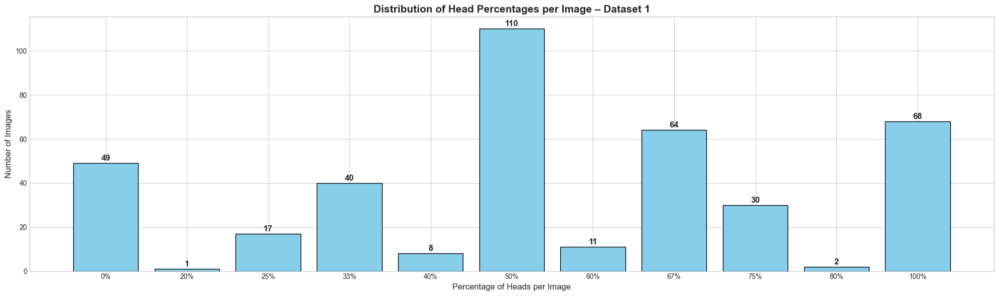

In [ ]:
import os
from collections import Counter
import matplotlib.pyplot as plt


label_dir = "runs/predict/Q2/dataset1_results_extra/labels"

# Class ID for heads
HEAD_CLASS = "1"

head_percentages = []

# Loop through label files to calculate head percentage per image
for filename in os.listdir(label_dir):  
    if filename.endswith(".txt"):                                            #only reading the .txt
        head_count = 0                                                       #set up counter for head
        total_count = 0                                                      #set up counter for total number of coins
        with open(os.path.join(label_dir, filename), "r") as f:              #open the labels 
            for line in f:                                                     
                parts = line.strip().split()                                 #split into classID and coordinates 
                if parts:
                    total_count += 1                                         #count the coin
                    if parts[0] == HEAD_CLASS:                               #check if it's head e.g., should be 1
                        head_count += 1                                      #count head
        # Avoid division by zero
        if total_count > 0:                                                  # only calculate if coins were detected 
            percentage = round((head_count / total_count) * 100)             #calculate head percentage
            head_percentages.append(percentage)                              #saving the result 

# Count how many images had each head percentage
value_counts = Counter(head_percentages)
sorted_items = sorted(value_counts.items())  # Sort by percentage

# Separate into x (percentage values) and y (image counts)
x_vals = [f"{val}%" for val, _ in sorted_items]
y_vals = [count for _, count in sorted_items]

# Plot the bar chart
plt.style.use("seaborn-v0_8-whitegrid")
fig, ax = plt.subplots(figsize=(20, 6))  # Wider layout to avoid overlap

bars = ax.bar(x_vals, y_vals, color='skyblue', edgecolor='black')

# Add number labels above each bar
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.5, str(int(height)),
            ha='center', va='bottom', fontsize=12, fontweight='bold')

# Set title and axis labels
ax.set_title("Distribution of Head Percentages per Image – Dataset 1", fontsize=15, fontweight='bold')
ax.set_xlabel("Percentage of Heads per Image", fontsize=12)
ax.set_ylabel("Number of Images", fontsize=12)

plt.tight_layout()
plt.show()


## Q2: Creating a Distribution plot for Dataset2 Only Head Counts

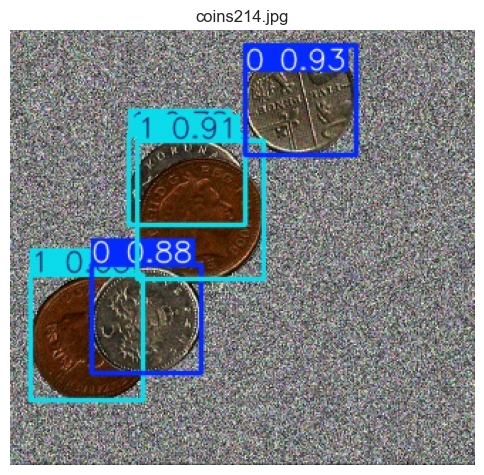

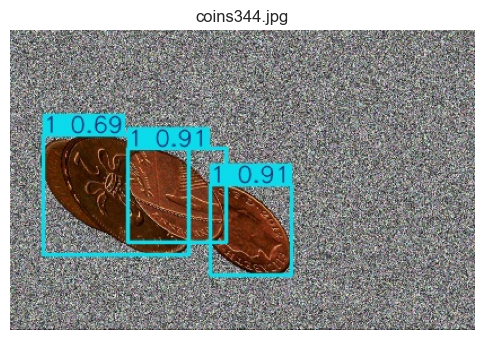

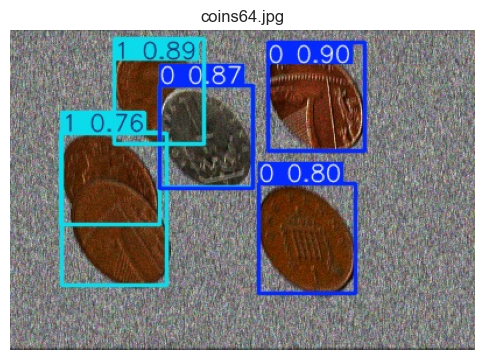

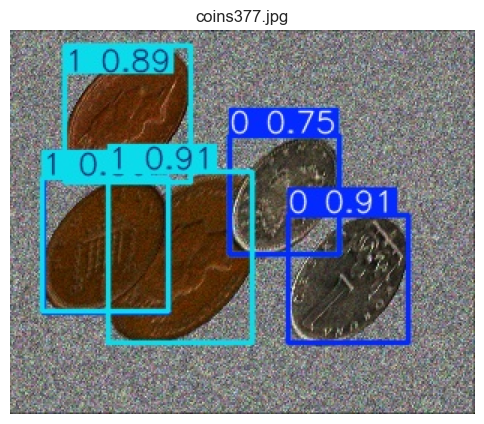

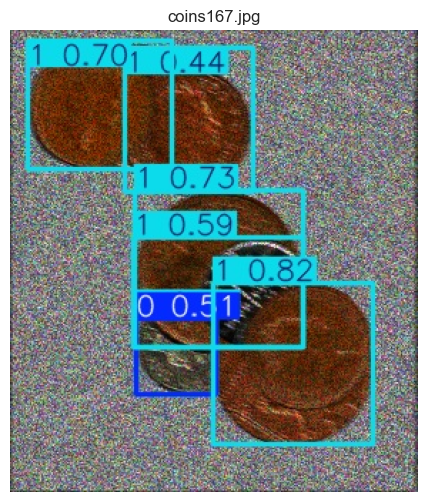

In [66]:
                                                 #Visualizing some outputs form dataset2 

import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Folder containing YOLO output images (with boxes already drawn)
image_dir = "runs\predict\Q2\dataset2_results_extra"

# Get list of image files (ignore the 'labels' folder and non-image files)
image_files = [f for f in os.listdir(image_dir)
               if f.lower().endswith((".jpg", ".png", ".jpeg"))
               and not os.path.isdir(os.path.join(image_dir, f))]

# Randomly select 5 images
sampled_images = random.sample(image_files, 5)

# Display each image
for filename in sampled_images:
    img_path = os.path.join(image_dir, filename)
    img = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(filename)
    plt.show()


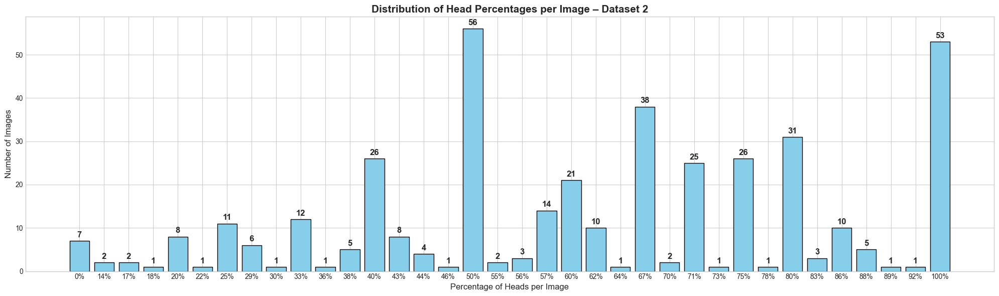

In [ ]:
import os
from collections import Counter
import matplotlib.pyplot as plt


label_dir = "runs\predict\Q2\dataset2_results_extra\labels"


HEAD_CLASS = "1"

head_percentages = []

# Loop through label files to calculate head percentage per image
for filename in os.listdir(label_dir):
    if filename.endswith(".txt"):
        head_count = 0
        total_count = 0
        with open(os.path.join(label_dir, filename), "r") as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    total_count += 1
                    if parts[0] == HEAD_CLASS:
                        head_count += 1

        if total_count > 0:
            percentage = round((head_count / total_count) * 100)  # Integer percentage
            head_percentages.append(percentage)

# Count how many images had each head percentage
value_counts = Counter(head_percentages)
sorted_items = sorted(value_counts.items())  # Sort by percentage

# Separate into x (percentage values) and y (image counts)
x_vals = [f"{val}%" for val, _ in sorted_items]
y_vals = [count for _, count in sorted_items]

# Plot the bar chart
plt.style.use("seaborn-v0_8-whitegrid")
fig, ax = plt.subplots(figsize=(20, 6))  # Wider layout to avoid overlap

bars = ax.bar(x_vals, y_vals, color='skyblue', edgecolor='black')

# Add number labels above each bar
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.5, str(int(height)),
            ha='center', va='bottom', fontsize=12, fontweight='bold')

# Set title and axis labels
ax.set_title("Distribution of Head Percentages per Image – Dataset 2", fontsize=15, fontweight='bold')
ax.set_xlabel("Percentage of Heads per Image", fontsize=12)
ax.set_ylabel("Number of Images", fontsize=12)

plt.tight_layout()
plt.show()


In [8]:
import os
os.getcwd()

!jupyter nbconvert --to webpdf "C:\Users\Amir\Desktop\Hexcel Technical interview\AmirTavahin.ipynb"

[NbConvertApp] Converting notebook C:\Users\Amir\Desktop\Hexcel Technical interview\AmirTavahin.ipynb to webpdf
[NbConvertApp] WARNING | Alternative text is missing on 24 image(s).
[NbConvertApp] Building PDF
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 11956272 bytes to C:\Users\Amir\Desktop\Hexcel Technical interview\AmirTavahin.pdf
